## Importing libraries

In [1]:
# Importing libraries
import pandas as pd
import numpy as np

# https://www.linkedin.com/pulse/obtaining-different-results-when-rerunning-identical-neural-boire/
from numpy.random import seed

seed(1)

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import keras
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Dense, Dropout, Flatten, Conv2D)
from tensorflow.keras.layers import SeparableConv2D, ReLU, MaxPooling2D, Add, Input
from tensorflow.keras.layers import BatchNormalization, GlobalAvgPool2D
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing import image
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.utils import to_categorical


from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns
import os

## Reading in the data

In [2]:
img_size = 256

In [3]:
directory = "./part_01/food-5k/training"

train_data = tf.keras.preprocessing.image_dataset_from_directory(
          directory,
          labels='inferred',
          label_mode='categorical',
#           class_names=['food', 'non_food'],
          color_mode='rgb',
          batch_size=32,
          image_size=(img_size, img_size),
#           shuffle=True,
          seed=13,
          validation_split=None,
          subset=None,
#           interpolation='bilinear',
#           follow_links=False,
#           crop_to_aspect_ratio=True
)

Found 3000 files belonging to 2 classes.


In [4]:
directory_test = "./part_01/food-5k/validation"

test_data = tf.keras.preprocessing.image_dataset_from_directory(
          directory,
          labels='inferred',
          label_mode='categorical',
#           class_names=['food', 'non_food'],
          color_mode='rgb',
          batch_size=32,
          image_size=(img_size, img_size),
#           shuffle=True,
          seed=13,
          validation_split=None,
          subset=None,
#           interpolation='bilinear',
#           follow_links=False,
#           crop_to_aspect_ratio=True
)

Found 3000 files belonging to 2 classes.


In [5]:
train_data

<BatchDataset shapes: ((None, 256, 256, 3), (None, 2)), types: (tf.float32, tf.float32)>

In [6]:
class_names = test_data.class_names
n_classes = len(class_names)
n_classes, class_names

(2, ['food', 'non_food'])

In [7]:
# splitting our images and labels into X_train and y_train
# converting them to numpy arrays in order to be able to resize them
for images, labels in train_data.take(1):  # only take first element of dataset
    X_train = images.numpy()
    y_train = labels.numpy()

# doing the same as above for our test_data
for images, labels in test_data.take(1):  # only take first element of dataset
    X_test = images.numpy()
    y_test = labels.numpy()

In [8]:
# checking the shape of X_train and y_train
print(X_train.shape, y_train.shape)

(32, 256, 256, 3) (32, 2)


In [9]:
# checking the shape of X_test, y_test
print(X_test.shape, y_test.shape)

(32, 256, 256, 3) (32, 2)


In [10]:
# resizing our arrays to get the values between 0-1 which will speed up our model output
X_train /= 255
X_test /= 255

In [11]:
# creating our input variable for our model from the shape of our first X_train set of values
input_shape = X_train[0].shape
input_shape

(256, 256, 3)

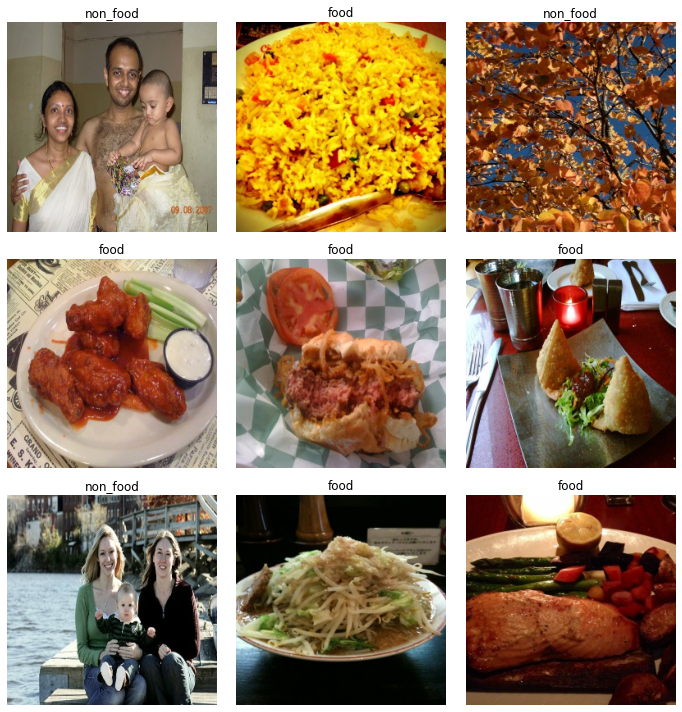

In [12]:
# code help from https://www.tensorflow.org/tutorials/images/classification
plt.figure(figsize=(10, 10))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(X_train[i])
    plt.title(class_names[tf.argmax(y_train[i], axis=0)]) ## thanks to: https://stackoverflow.com/questions/41399481/how-do-you-decode-one-hot-labels-in-tensorflow
    plt.axis("off")
    plt.tight_layout()

## Modeling with Neural Nets

In [13]:
model = Sequential()

model.add(Flatten(input_shape=(img_size, img_size, 3)))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))

model.add(Dense(n_classes, activation='sigmoid'))

model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              optimizer='adam',
              metrics=['accuracy'])

early_stop = EarlyStopping(patience = 10)

In [14]:
results = model.fit(X_train, y_train, validation_data=(X_test, y_test),
          epochs=40, batch_size=32, callbacks=early_stop, verbose=1)

Epoch 1/40


/opt/anaconda3/lib/python3.8/site-packages/keras/backend.py:4846: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  warnings.warn(


1/1 [==============================] - 1s 883ms/step - loss: 0.6761 - accuracy: 0.5312 - val_loss: 15.7351 - val_accuracy: 0.6250
Epoch 2/40
1/1 [==============================] - 0s 313ms/step - loss: 15.4809 - accuracy: 0.6250 - val_loss: 156.6000 - val_accuracy: 0.3750
Epoch 3/40
1/1 [==============================] - 0s 318ms/step - loss: 152.7126 - accuracy: 0.3750 - val_loss: 27.0375 - val_accuracy: 0.3750
Epoch 4/40
1/1 [==============================] - 0s 286ms/step - loss: 25.0323 - accuracy: 0.3750 - val_loss: 41.3781 - val_accuracy: 0.6250
Epoch 5/40
1/1 [==============================] - 0s 295ms/step - loss: 37.7873 - accuracy: 0.6250 - val_loss: 42.5099 - val_accuracy: 0.6250
Epoch 6/40
1/1 [==============================] - 0s 297ms/step - loss: 39.4569 - accuracy: 0.6250 - val_loss: 29.9306 - val_accuracy: 0.6250
Epoch 7/40
1/1 [==============================] - 0s 257ms/step - loss: 35.5216 - accuracy: 0.6250 - val_loss: 11.6223 - val_accuracy: 0.6250
Epoch 8/40
1/1 [

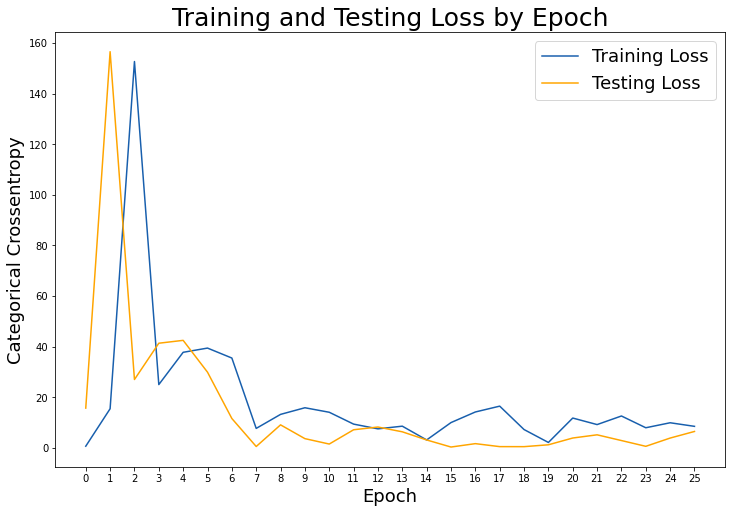

In [15]:
# Check out our train loss and test loss over epochs.
train_loss = results.history['loss']
test_loss = results.history['val_loss']
epoch_labels = results.epoch

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_loss, label='Training Loss', color='#185fad')
plt.plot(test_loss, label='Testing Loss', color='orange')

# Set title
plt.title('Training and Testing Loss by Epoch', fontsize=25)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Categorical Crossentropy', fontsize=18)
plt.xticks(epoch_labels, epoch_labels)    # ticks, labels

plt.legend(fontsize=18);

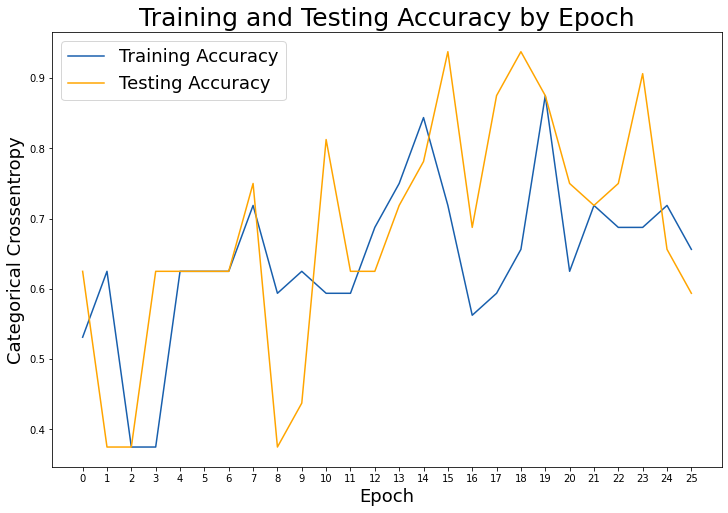

In [16]:
# Check out our train loss and test loss over epochs.
train_acc = results.history['accuracy']
test_acc = results.history['val_accuracy']
epoch_labels = results.epoch

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_acc, label='Training Accuracy', color='#185fad')
plt.plot(test_acc, label='Testing Accuracy', color='orange')

# Set title
plt.title('Training and Testing Accuracy by Epoch', fontsize=25)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Categorical Crossentropy', fontsize=18)
plt.xticks(epoch_labels, epoch_labels)    # ticks, labels

plt.legend(fontsize=18);

In [17]:
# Evaluate model on test data.
score = model.evaluate(X_test, y_test, verbose=1)

labels = model.metrics_names

# Compare CNN and FFNN models.

print(f'FFNN {labels[0]} : {score[0]}')
print(f'FFNN {labels[1]}  : {score[1]}')

1/1 [==============================] - 0s 73ms/step - loss: 6.5029 - accuracy: 0.5938
FFNN loss : 6.502889633178711
FFNN accuracy  : 0.59375


In [18]:
from tensorflow.keras.models import load_model, clone_model
model.save('FFNN_model_1.h5')

In [19]:
from tensorflow.keras import layers
# loading the model back in to use to make predictions
loaded_model = tf.keras.models.load_model('FFNN_model_1.h5')
loaded_model.layers[0].input_shape

loaded_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 196608)            0         
_________________________________________________________________
dense (Dense)                (None, 256)               50331904  
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1

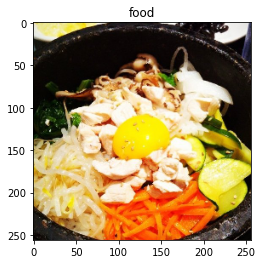

In [20]:

image_path="./part_01/food-5k/validation/food/5.jpg"
img = image.load_img(image_path, target_size=(img_size, img_size))
plt.imshow(img)
img = np.expand_dims(img, axis=0)
result=loaded_model.predict(img)
result = result.astype(int)
plt.title(class_names[np.argmax(result)])
plt.show()

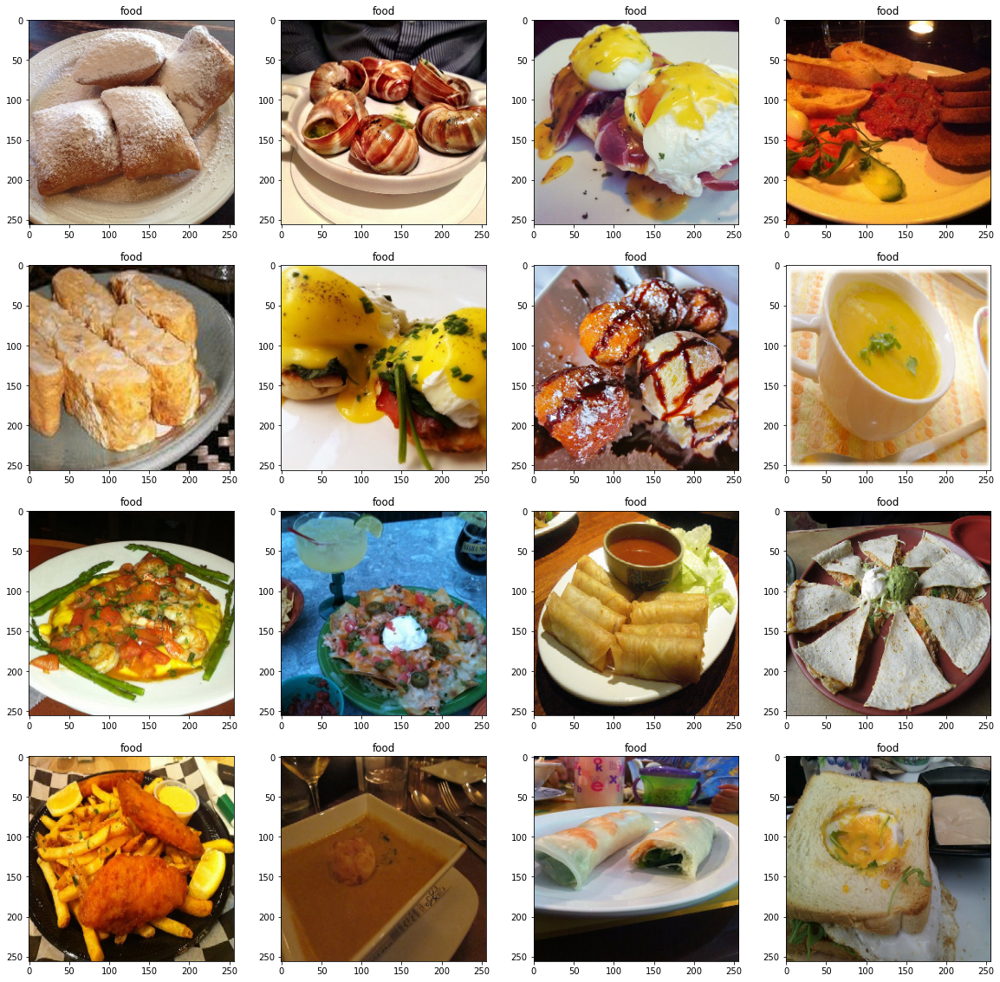

In [21]:
batch_holder = np.zeros((16, 256, 256, 3))
img_dir='./part_01/food-5k/validation/food/'
for i,img in enumerate(os.listdir(img_dir)[:16]):
    img = image.load_img((img_dir+img), target_size=(img_size,img_size))
    batch_holder[i, :] = img
    
result=(loaded_model.predict(batch_holder)).astype(int)

fig = plt.figure(figsize=(20, 20))

for i,img in enumerate(batch_holder):
    fig.add_subplot(4,4, i+1)
    plt.title(class_names[np.argmax(result[i])])
    plt.imshow(img/256.)


### ** Interpretation **

The testing data accuracy is not bad and our loss is pretty good but they bounce around quite a bit which seems a little unreliable. We'll try a CNN model below.

## Modeling with Convolutional Neural Nets

In [22]:
from keras import backend as K

In [23]:
# Instantiating CNN model
# code from lesson 8.03
cnn_model = Sequential()

# adding convolutional and pooling filter layers
# these layers will create filters over each image to detect edges and shapes
# conv layer 1
cnn_model.add(Conv2D(filters=8, # number of filters
                     kernel_size=(3,3),# height/width of filter
                     activation='relu', # activation function
                     data_format='channels_last',
                     input_shape=(input_shape)))

cnn_model.add(MaxPooling2D(pool_size=(2, 2), padding='same')) # dimensions of region of pooling

# conv layer 2
cnn_model.add(Conv2D(filters=6,
                     kernel_size=(3,3),
                     activation='relu'))

cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 3
cnn_model.add(Conv2D(filters=6,
                     kernel_size=(3,3),
                     activation='relu'))

cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 4
# cnn_model.add(Conv2D(filters=8,
#                      kernel_size=(3,3),
#                      activation='relu'))

# cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 5
# cnn_model.add(Conv2D(filters=12,
#                      kernel_size=(3,3),
#                      activation='relu'))

# cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 6
# cnn_model.add(Conv2D(filters=12,
#                      kernel_size=(4,4),
#                      activation='relu'))

# cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 7
# cnn_model.add(Conv2D(filters=16,
#                      kernel_size=(5,5),
#                      activation='relu'))

# cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))

# # conv layer 8
# cnn_model.add(Conv2D(filters=16,
#                      kernel_size=(5,5),
#                      activation='relu'))

# cnn_model.add(MaxPooling2D(pool_size=(2,2), padding='same'))


# flattening layers
cnn_model.add(Flatten())
# adding dense layers
cnn_model.add(Dense(256, activation='relu'))
# adding dropout to minimize overfitting

cnn_model.add(Dense(128, activation='relu'))

cnn_model.add(Dense(64, activation='relu'))

cnn_model.add(Dense(32, activation='relu'))
# final layer with number of classes as output
cnn_model.add(Dense(n_classes, activation='sigmoid'))

# compiling model with optimizer Adam and measuring for accuracy
cnn_model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])

# adding an early stop callback to end the model early if it starts to decline
early_stop = EarlyStopping(patience = 10)

In [24]:
# fitting and running the model
cnn_results = cnn_model.fit(X_train,y_train,
                            batch_size=64,
                            validation_data=(X_test, y_test),
                            epochs=40,
                            callbacks=early_stop,
                            verbose=1,
                            workers=4)

Epoch 1/40
1/1 [==============================] - 2s 2s/step - loss: 0.6970 - accuracy: 0.3438 - val_loss: 0.6783 - val_accuracy: 0.6875
Epoch 2/40
1/1 [==============================] - 1s 703ms/step - loss: 0.6783 - accuracy: 0.6875 - val_loss: 0.6308 - val_accuracy: 0.9062
Epoch 3/40
1/1 [==============================] - 1s 749ms/step - loss: 0.6308 - accuracy: 0.9062 - val_loss: 0.5517 - val_accuracy: 0.9688
Epoch 4/40
1/1 [==============================] - 1s 681ms/step - loss: 0.5517 - accuracy: 0.9688 - val_loss: 0.4450 - val_accuracy: 0.9688
Epoch 5/40
1/1 [==============================] - 1s 897ms/step - loss: 0.4450 - accuracy: 0.9688 - val_loss: 0.3284 - val_accuracy: 0.9688
Epoch 6/40
1/1 [==============================] - 1s 729ms/step - loss: 0.3284 - accuracy: 0.9688 - val_loss: 0.2249 - val_accuracy: 0.9375
Epoch 7/40
1/1 [==============================] - 1s 707ms/step - loss: 0.2249 - accuracy: 0.9375 - val_loss: 0.1583 - val_accuracy: 0.9375
Epoch 8/40
1/1 [=======

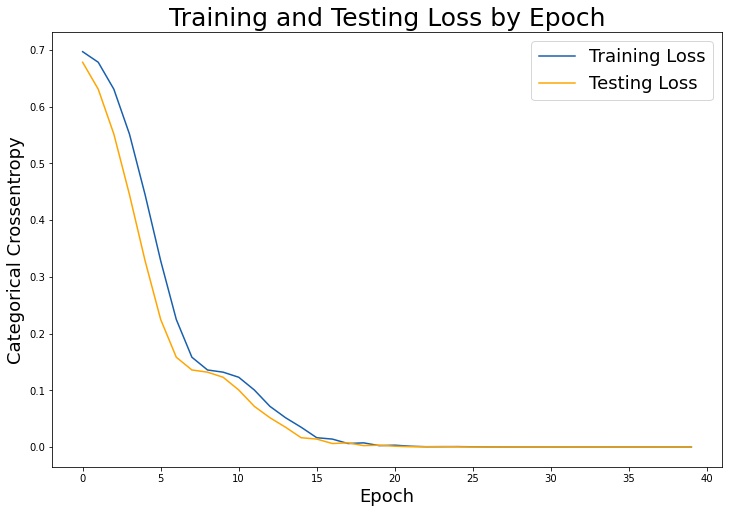

In [25]:
# Check out our train loss and test loss over epochs.
train_loss = cnn_results.history['loss']
test_loss = cnn_results.history['val_loss']

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_loss, label='Training Loss', color='#185fad')
plt.plot(test_loss, label='Testing Loss', color='orange')

# Set title
plt.title('Training and Testing Loss by Epoch', fontsize=25)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Categorical Crossentropy', fontsize=18)
# plt.xticks(np.arange(10), np.arange(10))

plt.legend(fontsize = 18);

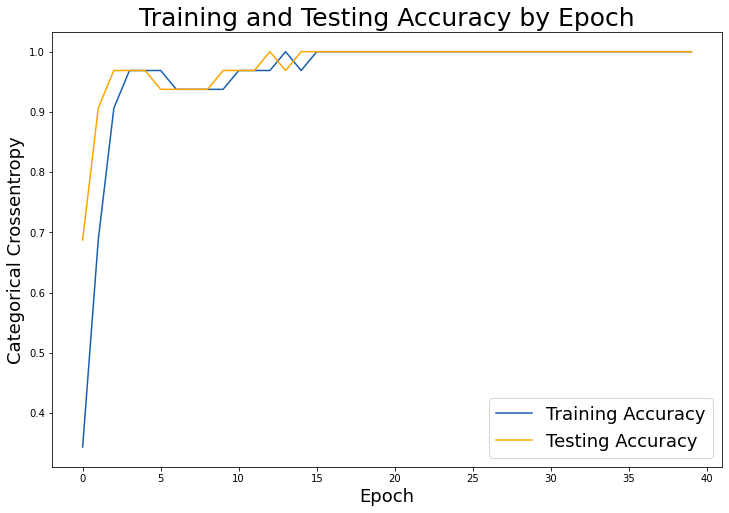

In [26]:
# Check out our train loss and test loss over epochs.
train_acc = cnn_results.history['accuracy']
test_acc = cnn_results.history['val_accuracy']

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_acc, label='Training Accuracy', color='#185fad')
plt.plot(test_acc, label='Testing Accuracy', color='orange')

# Set title
plt.title('Training and Testing Accuracy by Epoch', fontsize=25)
plt.xlabel('Epoch', fontsize=18)
plt.ylabel('Categorical Crossentropy', fontsize=18)
# plt.xticks(np.arange(10), np.arange(10))

plt.legend(fontsize = 18);

In [27]:
# Evaluate model on test data.

cnn_score = cnn_model.evaluate(X_test, y_test, verbose=1)

cnn_labels = cnn_model.metrics_names

# Compare CNN and FFNN models.
print(f'CNN {cnn_labels[0]}  : {cnn_score[0]}')
print(f'CNN {cnn_labels[1]}   : {cnn_score[1]}')
print()
print(f'FFNN {labels[0]} : {score[0]}')
print(f'FFNN {labels[1]}  : {score[1]}')

1/1 [==============================] - 0s 330ms/step - loss: 6.6160e-06 - accuracy: 1.0000
CNN loss  : 6.6159627749584615e-06
CNN accuracy   : 1.0

FFNN loss : 6.502889633178711
FFNN accuracy  : 0.59375


Our CNN model improved our accuracy and reduced our loss significantly and with a smoother more reliable line to the output. We'll try this model on new data below.

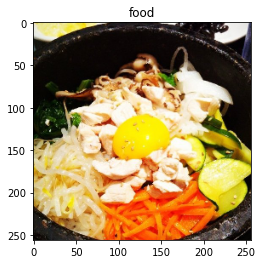

In [28]:
# # our image path to one of our dataset's images
image_path="./part_01/food-5k/validation/food/5.jpg"
img = image.load_img(image_path, target_size=(img_size, img_size))
plt.imshow(img)
img = np.expand_dims(img, axis=0)
result = cnn_model.predict(img)
result = result.astype(int)
plt.title(class_names[np.argmax(result)])
plt.show()

In [29]:
# saving the model
cnn_model.save('CNN_food_notfood.h5')

In [30]:
## code from lesson 9.04
## Make predictions on testing dataset
preds = np.argmax(model.predict(X_test), axis = 1)

## Save predictions to dataframe & output to .csv
X_test_pred_df = pd.DataFrame({
    'Label': preds,
    'ImageId': range(1,X_test.shape[0] + 1)
})
X_test_pred_df.to_csv('CNN_fnf_preds.csv', index=False)

In [31]:
from tensorflow.keras import layers
# loading the model back in to use to make predictions
loaded_model_CNN = tf.keras.models.load_model('CNN_food_notfood.h5')
loaded_model_CNN.layers[0].input_shape

loaded_model_CNN.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 8)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 6)       438       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 63, 63, 6)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 61, 61, 6)         330       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 31, 31, 6)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 5766)             

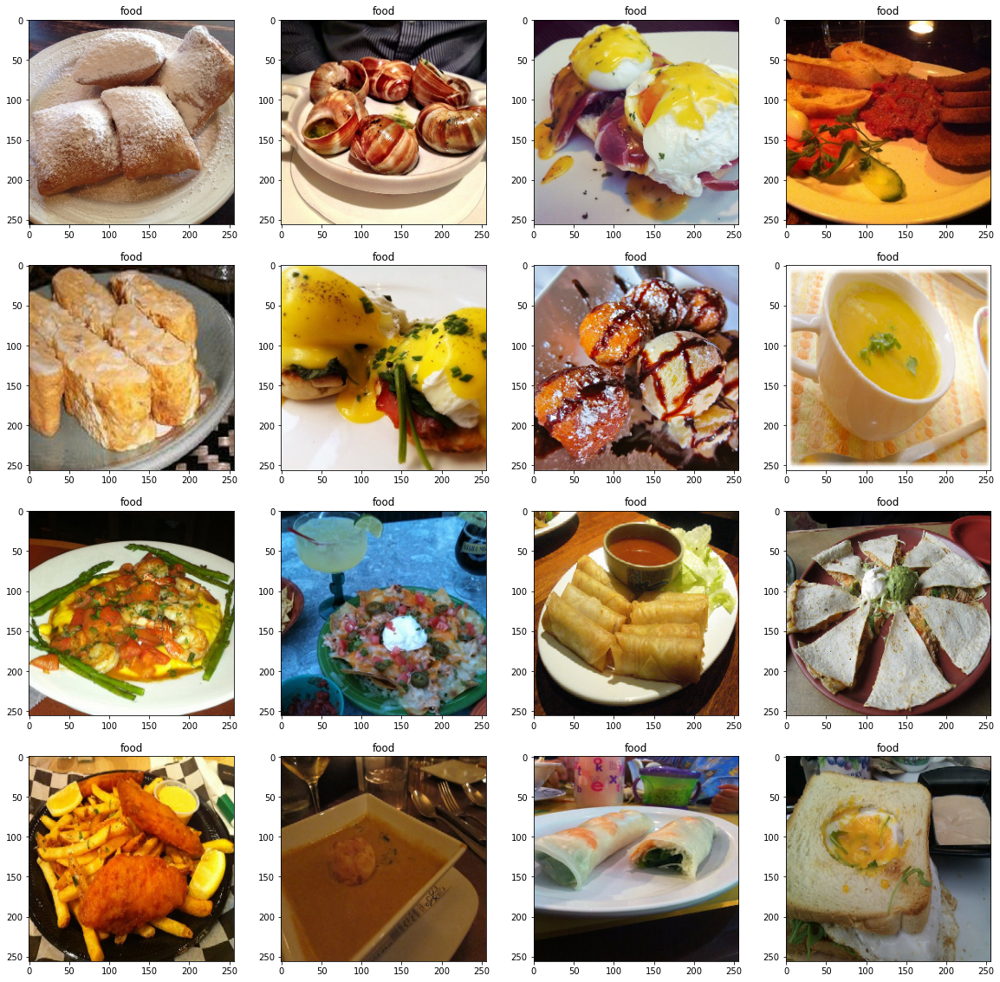

In [32]:
batch_holder = np.zeros((16, 256, 256, 3))
img_dir='./part_01/food-5k/validation/food/'
for i,img in enumerate(os.listdir(img_dir)[:16]):
    img = image.load_img((img_dir+img), target_size=(img_size,img_size))
    batch_holder[i, :] = img
    
result=(loaded_model_CNN.predict(batch_holder)).astype(int)

fig = plt.figure(figsize=(20, 20))

for i,img in enumerate(batch_holder):
    fig.add_subplot(4,4, i+1)
    plt.title(class_names[np.argmax(result[i])])
    plt.imshow(img/256.)


### ** Interpretation **

The CNN model, with 2 convolutional layers and 5 dense layers and 2 dropout layers, performed much better than our feed-forward neural network. We achieved 100% accuracy with a very low loss for our training and testing data.

However, when we evaluate the model again on the testing data, we get 72% accuracy.

## Testing our CNN model on new data

In [33]:
directory_eval = "./part_01/food-5k/evaluation"

X_eval = tf.keras.preprocessing.image_dataset_from_directory(
          directory_eval,
          labels='inferred',
          label_mode='categorical',
#           class_names=['food', 'non_food'],
          color_mode='rgb',
          batch_size=32,
          image_size=(img_size, img_size),
#           shuffle=True,
          seed=13,
          validation_split=None,
          subset=None,
#           interpolation='bilinear',
#           follow_links=False,
#           crop_to_aspect_ratio=True
)

Found 1000 files belonging to 2 classes.


In [34]:
for images, labels in X_eval.take(1):  # only take first element of dataset
    X_eval = images.numpy()
    y_eval = labels.numpy()

X_eval /= 255

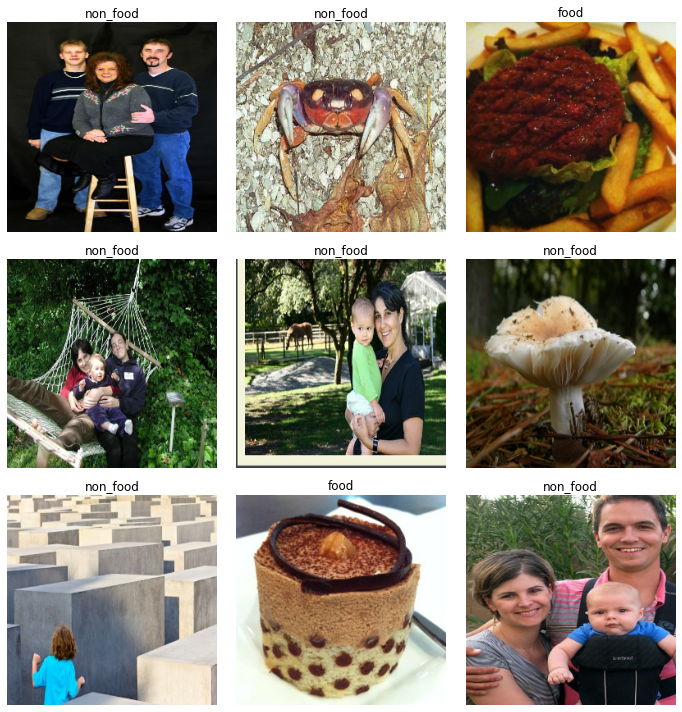

In [35]:
plt.figure(figsize=(10, 10))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(X_eval[i])
    plt.title(class_names[tf.argmax(y_eval[i], axis=0)]) ## thanks to: https://stackoverflow.com/questions/41399481/how-do-you-decode-one-hot-labels-in-tensorflow
    plt.axis("off")
    plt.tight_layout()

In [36]:
# Evaluate model on test data.
cnn__score = cnn_model.evaluate(X_test, y_test, verbose=1)
cnn__eval_score = cnn_model.evaluate(X_eval, y_eval, verbose=1)


1/1 [==============================] - 0s 229ms/step - loss: 3.5014 - accuracy: 0.7500


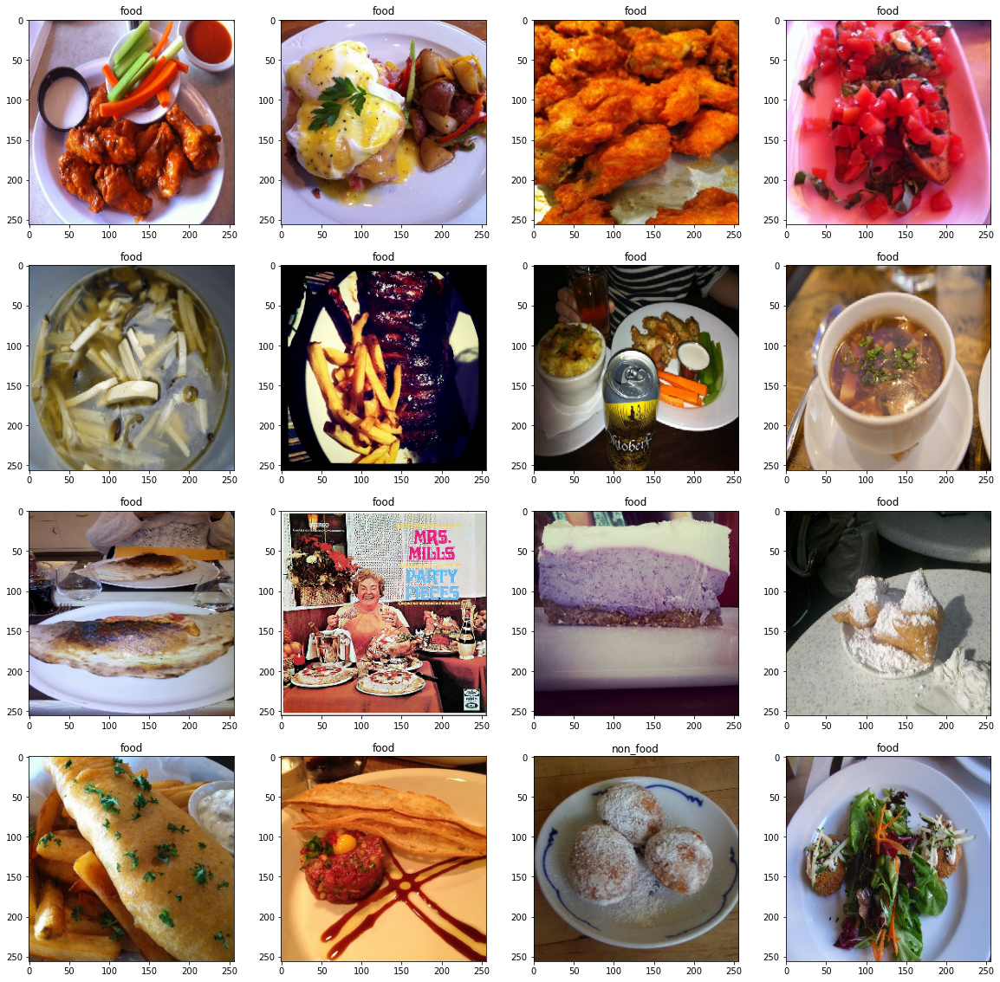

In [37]:
batch_holder = np.zeros((16, 256, 256, 3))
img_dir='./part_01/food-5k/evaluation/food/'
for i,img in enumerate(os.listdir(img_dir)[:16]):
    img = image.load_img((img_dir+img), target_size=(img_size,img_size))
    batch_holder[i, :] = img
    
result=(loaded_model_CNN.predict(batch_holder)).astype(int)

fig = plt.figure(figsize=(20, 20))

for i,img in enumerate(batch_holder):
    fig.add_subplot(4,4, i+1)
    plt.title(class_names[np.argmax(result[i])])
    plt.imshow(img/256.)

When we evaulate the model on new data, our accuracy is much lower.

## Transfer Learning to Food Indentification Dataset

In [38]:
directory_eval_2 = "./part_01/food-11/images/desserts"

train_data_2 = tf.keras.preprocessing.image_dataset_from_directory(
          directory_eval_2,
          labels='inferred',
          label_mode='categorical',
          color_mode='rgb',
          batch_size=32,
          image_size=(img_size, img_size),
          shuffle=True,
          seed=13,
          validation_split=0.2,
          subset='training',
#           interpolation='bilinear',
#           follow_links=False,
#           crop_to_aspect_ratio=True
)

Found 20000 files belonging to 20 classes.
Using 16000 files for training.


In [39]:
test_data_2 = tf.keras.preprocessing.image_dataset_from_directory(
          directory_eval_2,
          labels='inferred',
          label_mode='categorical',
          color_mode='rgb',
          batch_size=32,
          image_size=(img_size, img_size),
          shuffle=True,
          seed=13,
          validation_split=0.2,
          subset='validation',
#           interpolation='bilinear',
#           follow_links=False,
#           crop_to_aspect_ratio=True
)

Found 20000 files belonging to 20 classes.
Using 4000 files for validation.


In [40]:
class_names_2 = test_data_2.class_names
n_classes_2 = len(class_names_2)
n_classes_2, class_names_2

(20,
 ['apple_pie',
  'baklava',
  'beignets',
  'bread_pudding',
  'cannoli',
  'carrot_cake',
  'cheesecake',
  'chocolate_cake',
  'chocolate_mousse',
  'churros',
  'creme_brulee',
  'cup_cakes',
  'donuts',
  'frozen_yogurt',
  'ice_cream',
  'macarons',
  'panna_cotta',
  'red_velvet_cake',
  'strawberry_shortcake',
  'tiramisu'])

In [41]:
for images, labels in train_data_2.take(1):  # only take first element of dataset
    X_train_2 = images.numpy()
    y_train_2 = labels.numpy()
    
for images, labels in test_data_2.take(1):  # only take first element of dataset
    X_test_2 = images.numpy()
    y_test_2 = labels.numpy()
    
X_train_2 /= 255
X_test_2 /= 255

X_train_2 = X_train_2.reshape(X_train_2.shape[0], img_size, img_size, 3)
X_test_2 = X_test_2.reshape(X_test_2.shape[0], img_size, img_size, 3)

X_train_2.shape, X_test_2.shape

((32, 256, 256, 3), (32, 256, 256, 3))

In [42]:
y_train_2.shape, y_test_2.shape

((32, 20), (32, 20))

In [43]:
# y_train_2 = to_categorical(y_train_2, 20).astype(int)
# y_test_2 = to_categorical(y_test_2, 20).astype(int)
# y_train_2[0][0]

In [44]:
# plt.figure(figsize=(10, 10))

# for i in range(9):
#     ax = plt.subplot(3, 3, i + 1)
#     plt.imshow(X_test_2[i])
#     plt.title(class_names(y_test_2[i]))
#     plt.axis("off")
#     plt.tight_layout()

In [46]:
# ## Clone model & copy weights so we can train our new model without impacting the original
CNN_2_clone = clone_model(loaded_model_CNN)
CNN_2_clone.set_weights(loaded_model_CNN.get_weights())

# ## Create our new model, using the all layers except for the output layer from the previous model
CNN_2 = Sequential(CNN_2_clone.layers[:-1])

# ## In order to train the weights on just the output layer first, set the reused layers to not be trainable
for layer in CNN_2.layers[:-1]:
    layer.trainable = False

# # add a global spatial average pooling layer
# x = CNN_2_clone.get_layer(index=5).output
# x = SeparableConv2D(6, 3)(x)
# x = MaxPooling2D()(x)
# # let's add a fully-connected layer
# x = Flatten()(x)
# cnn_2.add(Dense(32, activation='relu'))
# # and a logistic layer 
CNN_2.add(Dense(n_classes_2, activation='softmax'))

# # this is the model we will train
# model_2 = Model(inputs=CNN_2_clone.input, outputs=predictions)

CNN_2.compile(loss='categorical_crossentropy', 
                optimizer = 'adam', metrics=['accuracy'])

CNN_results_2 = CNN_2.fit(X_train_2, y_train_2,
                    validation_data=(X_test_2, y_test_2),
                    epochs = 10,
                    batch_size = 32)

Epoch 1/10
1/1 [==============================] - 1s 1s/step - loss: 11.5469 - accuracy: 0.0312 - val_loss: 6.0532 - val_accuracy: 0.0938
Epoch 2/10
1/1 [==============================] - 1s 883ms/step - loss: 7.2443 - accuracy: 0.0000e+00 - val_loss: 4.3933 - val_accuracy: 0.0938
Epoch 3/10
1/1 [==============================] - 1s 682ms/step - loss: 4.5532 - accuracy: 0.0000e+00 - val_loss: 3.9342 - val_accuracy: 0.0312
Epoch 4/10
1/1 [==============================] - 1s 841ms/step - loss: 3.5265 - accuracy: 0.0312 - val_loss: 3.7451 - val_accuracy: 0.0312
Epoch 5/10
1/1 [==============================] - 1s 654ms/step - loss: 3.1422 - accuracy: 0.0312 - val_loss: 3.6028 - val_accuracy: 0.0625
Epoch 6/10
1/1 [==============================] - 1s 812ms/step - loss: 2.9677 - accuracy: 0.0625 - val_loss: 3.4783 - val_accuracy: 0.0312
Epoch 7/10
1/1 [==============================] - 1s 668ms/step - loss: 2.8646 - accuracy: 0.0312 - val_loss: 3.3939 - val_accuracy: 0.0312
Epoch 8/10
1/1

In [ ]:

cnn__eval_score = model_2.evaluate(X_test_2, y_test_2, verbose=1)

Using transfer learning on this larger dataset did not work well. Our training and testing accuracy is very low.